<a href="https://www.kaggle.com/code/shamseldeenismaiil/ovarian-cancer?scriptVersionId=147967849" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np 
import pandas as pd 
import os
import os.path, sys
from tqdm import tqdm
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib as mpl
from IPython.display import display
%matplotlib inline
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc, accuracy_score
from skimage import data
from skimage.color import rgb2hed, hed2rgb

In [2]:
train_photodf = pd.read_csv("/kaggle/input/UBC-OCEAN/train.csv")
train_photodf_index = pd.read_csv("/kaggle/input/UBC-OCEAN/train.csv",index_col=0)

list_files = []
# giving directory name
dirname = '/kaggle/input/UBC-OCEAN/train_thumbnails'
 
# giving file extension
ext = ('_thumbnail.png')
 
# iterating over all files
for files in os.listdir(dirname):
    if files.endswith(ext):
        list_files.append(files)  
    else:
        continue
        
list_files_array = np.array(list_files)
id_images = list(map(int, [item.split('_thumbnail.png')[0] for item in list_files_array]))
df_thumbnail = train_photodf[train_photodf['image_id'].isin(id_images)]
df_thumbnail.set_index('image_id', inplace=True)

df_tumor = train_photodf_index[~train_photodf_index.index.isin(df_thumbnail.index)]

df_ntumor = df_thumbnail[df_thumbnail.index.isin(df_thumbnail.index[0:25])]

df_ntumorcropp = df_thumbnail[df_thumbnail.index.isin(df_thumbnail.index[0:9])]



In [3]:
def get_Image (row_id, root="/kaggle/input/UBC-OCEAN/train_images"):
    """
    Converts an image number into the file path where the image is located,
    opens the image, return the image as numpy array.
    
    """
    filename = "{}.png".format(row_id)
    file_path = os.path.join(root, filename)
    img = Image.open(file_path)
    left = int(img.size[0]/2-1000/2)
    upper = int(img.size[1]/2-1000/2)
    right = left + 1000
    lower = upper + 1000
    img_cropped = img.crop((left,upper,right,lower))
    
    return np.asarray(img_cropped)

def get_image3 (row_id, root="/kaggle/input/UBC-OCEAN/train_thumbnails"):
    """
    Converts an image number into the file path where the image is located,
    opens the image, return the image as numpy array.
    
    """
    filename = "{}_thumbnail.png".format(row_id)
    file_path = os.path.join(root, filename)
    img = Image.open(file_path)
    new_size = (1000,1000)
    img = img.resize(new_size)

    return np.array(img)

def get_image2 (row_id, root="/kaggle/input/UBC-OCEAN/train_images"):
    """
    Converts an image number into the file path where the image is located,
    opens the image, return the image as numpy array.
    
    """
    filename = "{}.png".format(row_id)
    file_path = os.path.join(root, filename)
    img = Image.open(file_path)
    new_size = (1000,1000)
    img = img.resize(new_size)

    return np.array(img)

In [4]:
%%time
def create_features(img):
    color_features = img.flatten()
    gray_image = rgb2gray(img)
    hog_features = hog(gray_image, block_norm='L2-Hys', pixels_per_cell=(16,16))
    flat_features = np.hstack([color_features,hog_features])
    return flat_features


CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.44 µs


In [5]:
def create_feature_matrix(T_dataframe,T_dataframe1):
    features_list = []
    
    for img_Id in tqdm(T_dataframe1.index[0:200]):
        Img = get_image3(img_Id)
        Image_features = create_features(Img)
        features_list.append(Image_features)
        
    
    
    
    for img_id in tqdm(T_dataframe.index):
        img = get_image2(img_id)
        image_features = create_features(img)
        features_list.append(image_features)
      
    feature_matrix = np.array(features_list)
    return feature_matrix

In [6]:
%%time
feature_matrix =create_feature_matrix(df_tumor,df_thumbnail)

100%|██████████| 25/25 [00:19<00:00,  1.28it/s]


CPU times: user 1min 30s, sys: 4.59 s, total: 1min 34s
Wall time: 1min 49s


In [7]:
df_ntumor200 = df_thumbnail[df_thumbnail.index.isin(df_thumbnail.index[0:200])]
sampleFrame = [df_tumor,df_ntumor200]
SampleTumor = pd.concat(sampleFrame)
SampleTumor.sort_index(axis=0, ascending=True)
SampleTumor.info()

<class 'pandas.core.frame.DataFrame'>
Index: 225 entries, 91 to 25792
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   label         225 non-null    object
 1   image_width   225 non-null    int64 
 2   image_height  225 non-null    int64 
 3   is_tma        225 non-null    bool  
dtypes: bool(1), int64(2), object(1)
memory usage: 7.3+ KB


In [8]:
X_train, X_test, y_train, y_test = train_test_split(feature_matrix , SampleTumor.is_tma.values, test_size = .3, random_state = 1234123)
pd.Series(y_train).value_counts()


False    139
True      18
Name: count, dtype: int64

In [9]:
print('Training features matrix shape:', X_train.shape)
ss = StandardScaler()
train_stand = ss.fit_transform(X_train)
test_stand = ss.fit_transform(X_test)
print('Standardized training features matrix shape is:',train_stand.shape)
print('Standardized testing features matrix shape is:',test_stand.shape)

Training features matrix shape: (157, 3291600)
Standardized training features matrix shape is: (157, 3291600)
Standardized testing features matrix shape is: (68, 3291600)


In [10]:
pca = PCA(n_components=35)
X_train = pca.fit_transform(train_stand)
X_test = pca.transform(test_stand)
print("training features matrix is:", X_train.shape)
print("testing features matrix is:",X_test.shape)


training features matrix is: (157, 35)
testing features matrix is: (68, 35)


In [11]:
# define support vector classifier
svm = SVC(kernel='linear', probability=True, random_state=42)
# fit model
svm.fit(X_train, y_train)
# generate predictions
y_pred = svm.predict(X_test)
# calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print('Model accuracy is: ', accuracy)

Model accuracy is:  0.8235294117647058


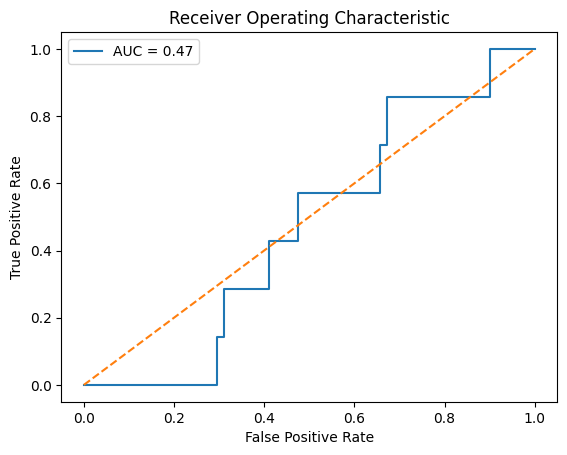

In [12]:
# predict probabilities for X_test using predict_proba
probabilities = svm.predict_proba(X_test)
# select the probabilities for label 1.0
y_proba = probabilities[:, 1]
# calculate false positive rate and true positive rate at different thresholds
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_proba, pos_label=1)
# calculate AUC
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
# plot the false positive rate on the x axis and the true positive rate on the y axis
roc_plot = plt.plot(false_positive_rate,
                    true_positive_rate,
                    label='AUC = {:0.2f}'.format(roc_auc))
plt.legend(loc=0)
plt.plot([0,1], [0,1], ls='--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate');

the image size is (3000, 2210)


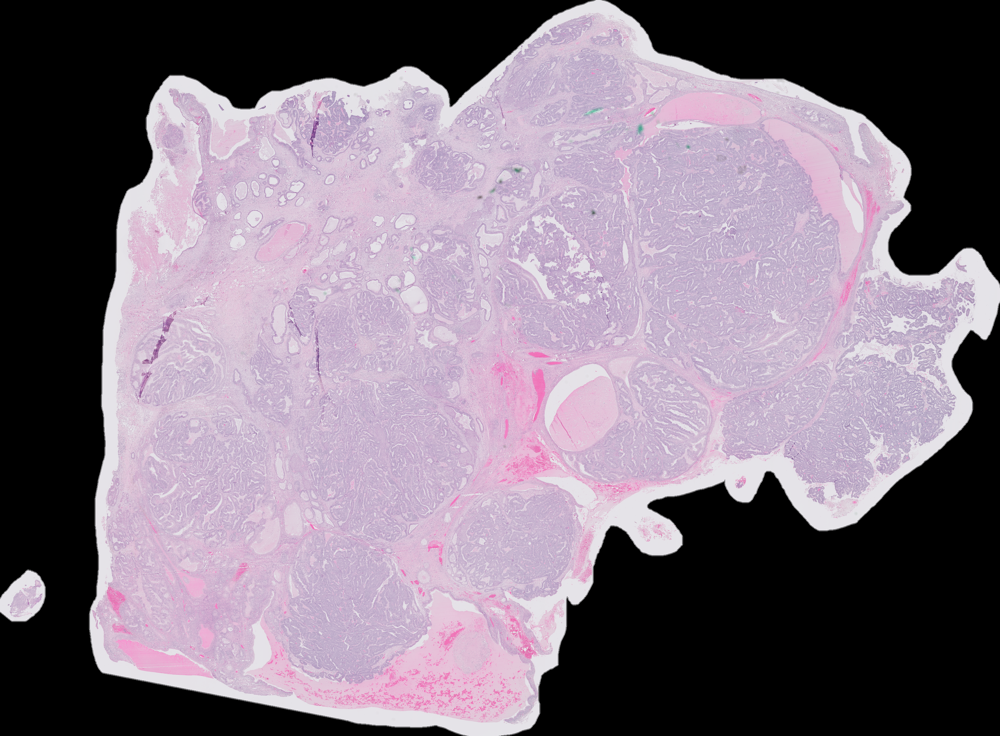

In [13]:
img = Image.open("/kaggle/input/UBC-OCEAN/train_thumbnails/10077_thumbnail.png")
print("the image size is {}".format(img.size))
display(img)

(224, 100)


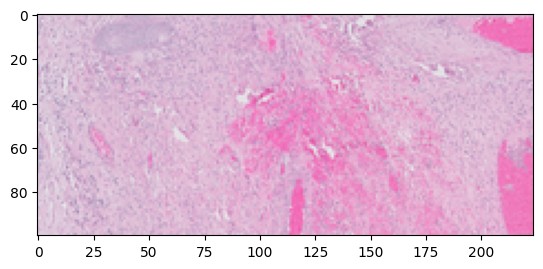

In [14]:
#center of image
left = int(img.size[0]/2-224/2)
upper = int(img.size[1]/2-100/2)
right = left +224
lower = upper + 100
img_cropped = img.crop((left, upper,right,lower))
print(img_cropped.size)
plt.imshow(np.asarray(img_cropped))

In [15]:
Img = Image.open("/kaggle/input/UBC-OCEAN/train_images/10077.png")
print("the image size is {}".format(Img.size))

the image size is (53143, 39150)


(1000, 1000)


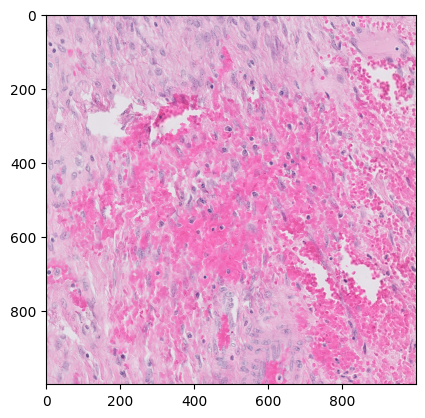

In [16]:
#center of image
left = int(Img.size[0]/2-1000/2)
upper = int(Img.size[1]/2-1000/2)
right = left +1000
lower = upper + 1000
Img_cropped = Img.crop((left, upper,right,lower))
#Img_cropped = Img.crop((40000,20000,43000,22210))
print(Img_cropped.size)
plt.imshow(np.asarray(Img_cropped))

In [17]:
def add_image(T_dataframe):
    image_list = []
    
    for img_id in tqdm(T_dataframe.index):
        img = get_image2(img_id)
        
        image_list.append(img)
      
    image_matrix = np.array(image_list)
    return image_matrix

def add_image1(T_dataframe):
    image_list = []
    
    for img_id in tqdm(T_dataframe.index):
        img = get_image3(img_id)
        
        image_list.append(img)
      
    image_matrix = np.array(image_list)
    return image_matrix


def add_Image(T_dataframe):
    image_list = []
    
    for img_id in tqdm(T_dataframe.index):
        img = get_Image(img_id)
        
        image_list.append(img)
      
    image_matrix = np.array(image_list)
    return image_matrix


In [18]:
df_tumor_matrix = add_image(df_tumor)
df_ntumor_matrix = add_image1(df_ntumor)


100%|██████████| 25/25 [00:06<00:00,  3.77it/s]


In [19]:
df_ntumorcropp_matrix = add_Image(df_ntumorcropp)

100%|██████████| 9/9 [06:18<00:00, 42.06s/it]


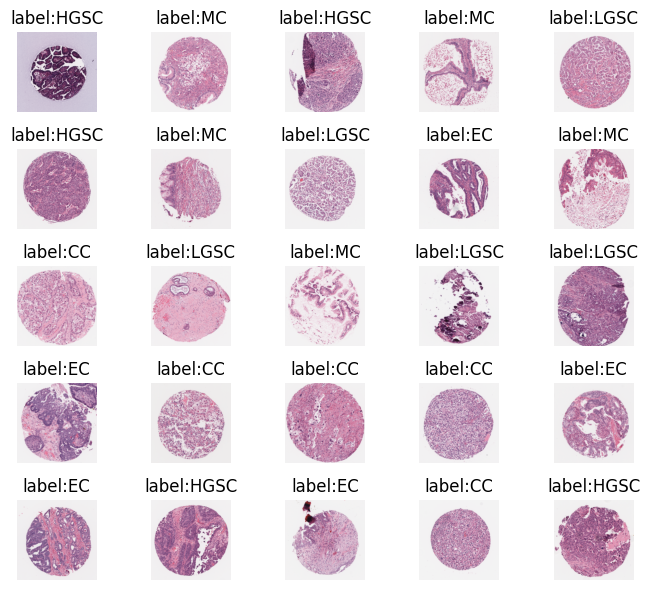

In [20]:
im = df_tumor_matrix
fig, axes = plt.subplots(5, 5, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(0,25):
    ax[i].imshow(im[i])
    ax[i].set_title("label:{}".format(df_tumor.iloc[i,0]))
    
     
    
for a in ax.ravel():
    a.axis('off')
    
       
fig.tight_layout()

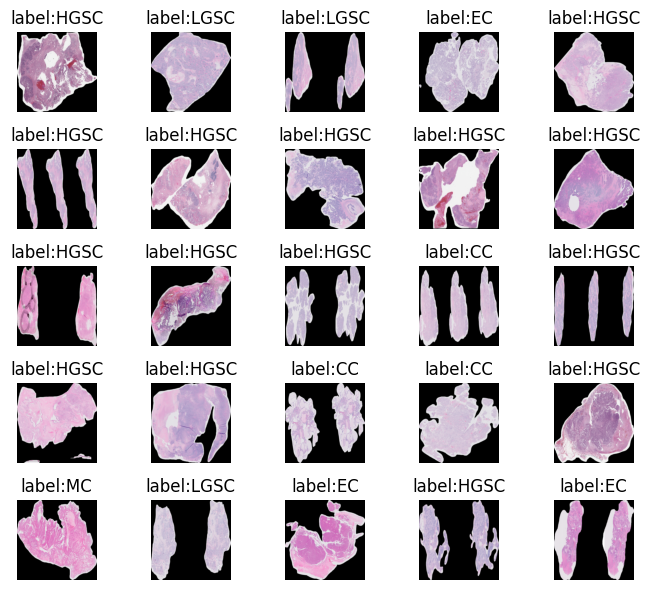

In [21]:
imN = df_ntumor_matrix
fig, axes = plt.subplots(5, 5, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(0,25):
    ax[i].imshow(imN[i])
    ax[i].set_title("label:{}".format(df_ntumor.iloc[i,0]))
    
     
    
for a in ax.ravel():
    a.axis('off')
    
       
fig.tight_layout()

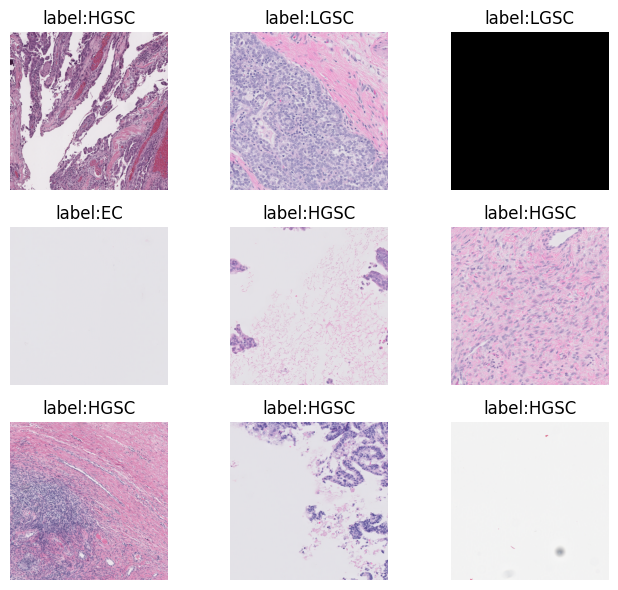

In [22]:
imcropped = df_ntumorcropp_matrix
fig, axes = plt.subplots(3, 3, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(0,9):
    ax[i].imshow(imcropped[i])
    ax[i].set_title("label:{}".format(df_ntumorcropp.iloc[i,0]))
    
     
    
for a in ax.ravel():
    a.axis('off')
    
       
fig.tight_layout()

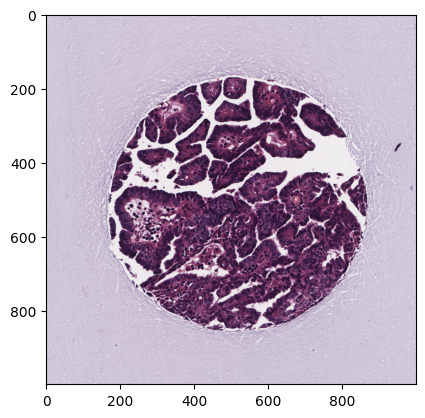

In [23]:
for i in range(0,1):
     plt.imshow(df_tumor_matrix[i])
     
     plt.show()

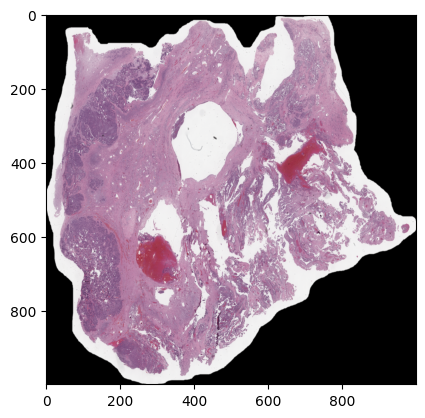

In [24]:
plt.imshow(df_ntumor_matrix[0])
plt.show()


In [25]:
def get_image (row_id, root="/kaggle/input/UBC-OCEAN/train_images"):
    """
    Converts an image number into the file path where the image is located,
    opens the image, return the image as numpy array.
    
    """
    filename = "{}.png".format(row_id)
    file_path = os.path.join(root, filename)
    img = Image.open(file_path)
    new_size = (2000,2000)
    img = img.resize(new_size)
    return np.array(img)

TumorImg = train_photodf_index[train_photodf_index.is_tma == True].index[24]
NonTumorImg = train_photodf_index[train_photodf_index.is_tma == False].index[24]


In [26]:
#plt.imshow(get_image(TumorImg))
#plt.show()

In [27]:
#plt.imshow(get_image(NonTumorImg))
#plt.show()

In [28]:
#TumorImg

In [29]:
#NonTumorImg

In [30]:
#Tumor = get_image(TumorImg)
#print(Tumor.shape)
#GrayTumor = rgb2gray(Tumor)
#plt.imshow(GrayTumor, cmap = mpl.cm.gray)
#print(GrayTumor.shape)

In [31]:
#NonTumor = get_image(NonTumorImg)
#print(NonTumor.shape)
#GrayNonTumor = rgb2gray(NonTumor)
#plt.imshow(GrayNonTumor, cmap = mpl.cm.gray)
#print(GrayNonTumor.shape)

In [32]:
#hog_features, hog_image = hog(GrayTumor,
                              #visualize=True,
                              #block_norm='L2-Hys',
                             # pixels_per_cell=(16,16))
#plt.imshow(hog_image)

In [33]:
#plt.imshow(hog_image, cmap=mpl.cm.gray)

In [34]:
#Tumor_features = create_features(Tumor)
#print("Tumor features shape:",Tumor_features.shape)

#NonTumor_features = create_features(NonTumor)
#print("NonTumor features shape:", NonTumor_features.shape)

In [35]:
#def create_feature_matrix3(T_dataframe):
   # features_list = []
    
    
    
  #  for img_id in tqdm(T_dataframe.index[0:50]):
      #  img = get_image2(img_id)
      #  image_features = create_features(img)
      #  features_list.append(image_features)
      
   # feature_matrix = np.array(features_list)
   # return feature_matrix
